In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("cow_train", {}, "./cows_class1/train/train_coco.json", "./cows_class1/train")
register_coco_instances("cow_val", {}, "./cows_class1/val/val_coco.json", "./cows_class1/val")


In [3]:
#dictionary create train için
cow_metadata = MetadataCatalog.get("cow_train")
print(cow_metadata)
dataset_dicts = DatasetCatalog.get("cow_train")
print(dataset_dicts)

Metadata(evaluator_type='coco', image_root='./cows_class1/train', json_file='./cows_class1/train/train_coco.json', name='cow_train')
[05/26 11:11:15 d2.data.datasets.coco]: Loaded 66 images in COCO format from ./cows_class1/train/train_coco.json
[{'file_name': './cows_class1/train/1_Holstein_Back_LiveWeight_490_CarcassWeight_254_01.jpg', 'height': 1280, 'width': 961, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [132.0, 95.0, 500.0, 1163.0], 'category_id': 0, 'segmentation': [[168.83333333333337, 202.72222222222229, 164.66666666666674, 284.66666666666674, 134.1111111111112, 388.83333333333337, 132.72222222222229, 458.2777777777778, 139.66666666666674, 495.7777777777778, 166.05555555555566, 543.0000000000001, 206.33333333333337, 594.3888888888889, 228.55555555555566, 648.5555555555557, 252.16666666666674, 701.3333333333334, 261.888888888889, 748.5555555555557, 243.83333333333348, 816.6111111111112, 238.27777777777783, 851.3333333333334, 250.77777777777783, 862.4444444444446, 275

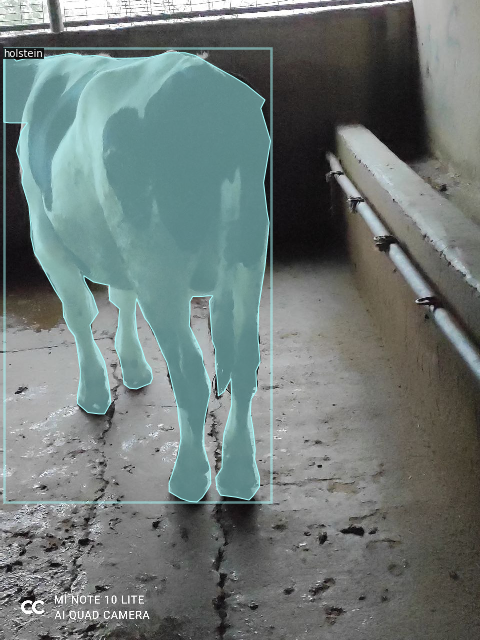

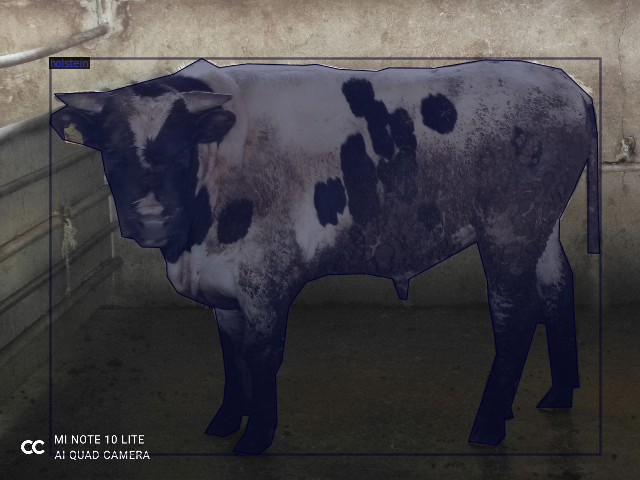

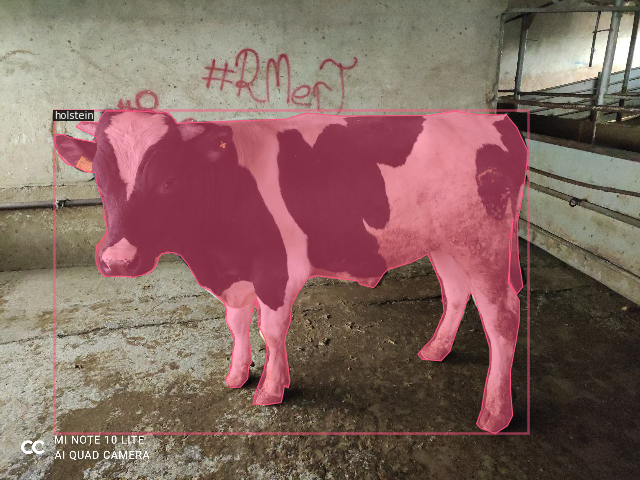

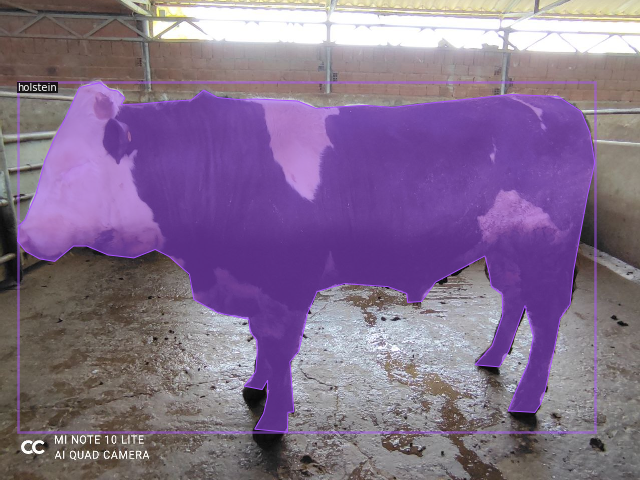

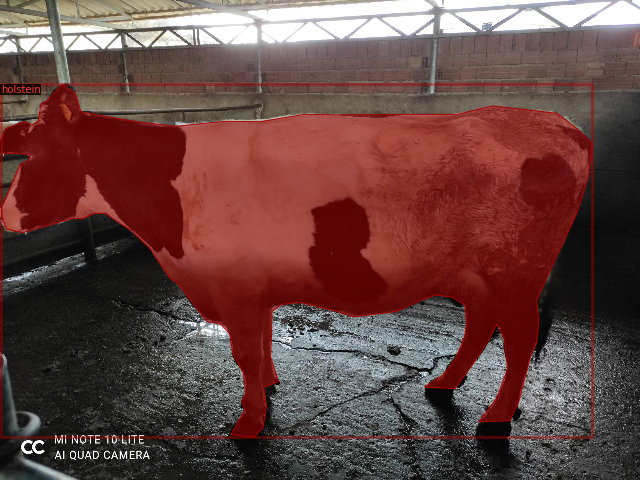

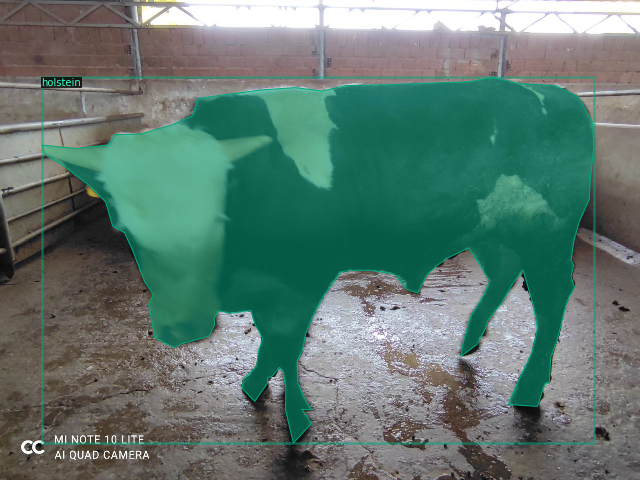

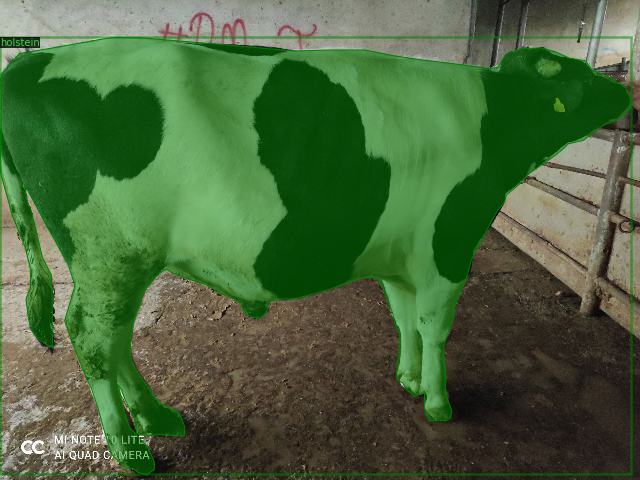

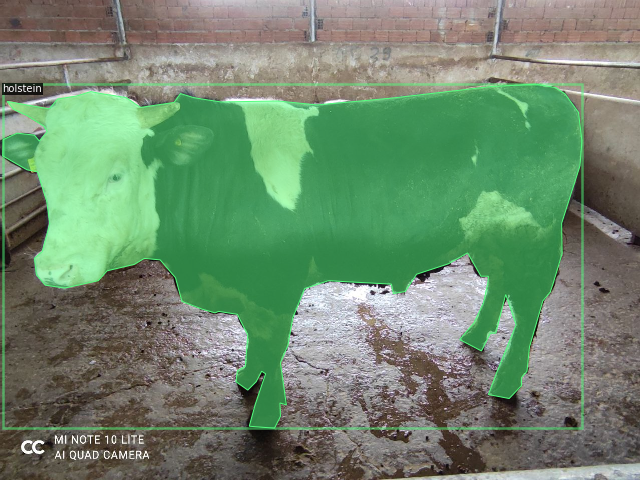

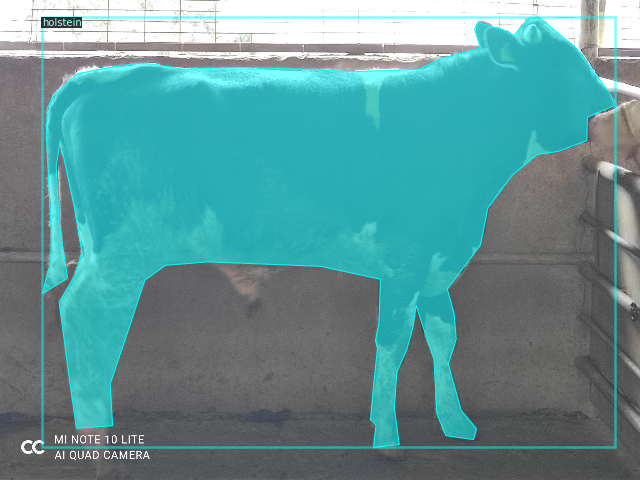

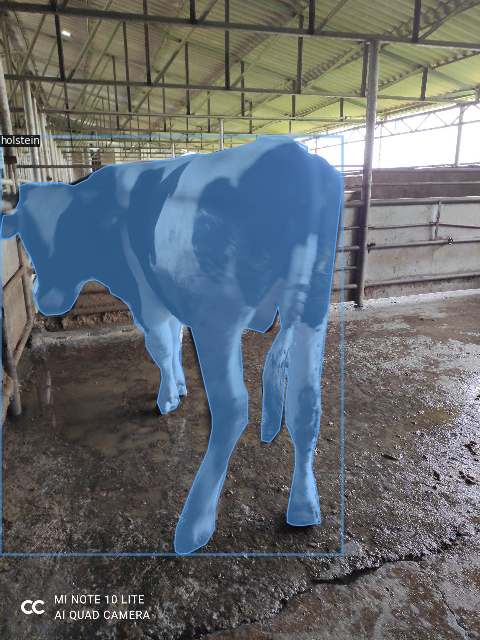

In [4]:
#train veri setinden örnekler
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cow_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [5]:
#training
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("cow_train",)
cfg.DATASETS.TEST = ("cow_val")
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/26 11:12:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:27, 6.47MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[05/26 11:12:47 d2.engine.train_loop]: Starting training from iteration 0
[05/26 11:13:11 d2.utils.events]:  eta: 0:05:16  iter: 19  total_loss: 1.94  loss_cls: 0.8148  loss_box_reg: 0.402  loss_mask: 0.6941  loss_rpn_cls: 0.002461  loss_rpn_loc: 0.006228  time: 1.1527  data_time: 0.0237  lr: 4.9953e-06  max_mem: 2340M
[05/26 11:13:33 d2.utils.events]:  eta: 0:04:57  iter: 39  total_loss: 1.808  loss_cls: 0.7188  loss_box_reg: 0.3673  loss_mask: 0.6777  loss_rpn_cls: 0.00366  loss_rpn_loc: 0.01136  time: 1.1467  data_time: 0.0107  lr: 9.9902e-06  max_mem: 2340M
[05/26 11:13:57 d2.utils.events]:  eta: 0:04:35  iter: 59  total_loss: 1.657  loss_cls: 0.5783  loss_box_reg: 0.4197  loss_mask: 0.6493  loss_rpn_cls: 0.002672  loss_rpn_loc: 0.007204  time: 1.1524  data_time: 0.0104  lr: 1.4985e-05  max_mem: 2340M
[05/26 11:14:20 d2.utils.events]:  eta: 0:04:14  iter: 79  total_loss: 1.513  loss_cls: 0.4434  loss_box_reg: 0.4663  loss_mask: 0.5919  loss_rpn_cls: 0.001361  loss_rpn_loc: 0.005352

In [6]:
#Inference & evaluation using the trained model
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [7]:
#dictionary create val için
dataset_dicts = DatasetCatalog.get("cow_val")
print(dataset_dicts)

[05/26 11:18:55 d2.data.datasets.coco]: Loaded 10 images in COCO format from ./cows_class1/val/val_coco.json
[{'file_name': './cows_class1/val/7_Holstein_Back_LiveWeight_490_CarcassWeight_270_01.jpg', 'height': 1280, 'width': 961, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [54.0, 114.0, 479.0, 937.0], 'category_id': 0, 'segmentation': [[54.36842105263156, 268.42105263157896, 104.36842105263156, 311.8421052631579, 88.57894736842104, 361.8421052631579, 92.52631578947364, 463.1578947368421, 113.57894736842104, 506.57894736842104, 133.31578947368416, 556.578947368421, 158.31578947368416, 606.578947368421, 191.21052631578948, 660.5263157894736, 201.73684210526312, 689.4736842105264, 214.8947368421052, 732.8947368421052, 191.21052631578948, 809.2105263157895, 228.0526315789474, 807.8947368421052, 257.0, 776.3157894736842, 232.0, 657.8947368421052, 257.0, 714.4736842105264, 284.63157894736844, 776.3157894736842, 288.57894736842104, 827.6315789473684, 310.9473684210526, 865.78947368

./cows_class1/val/7_Holstein_Back_LiveWeight_490_CarcassWeight_270_04.jpg


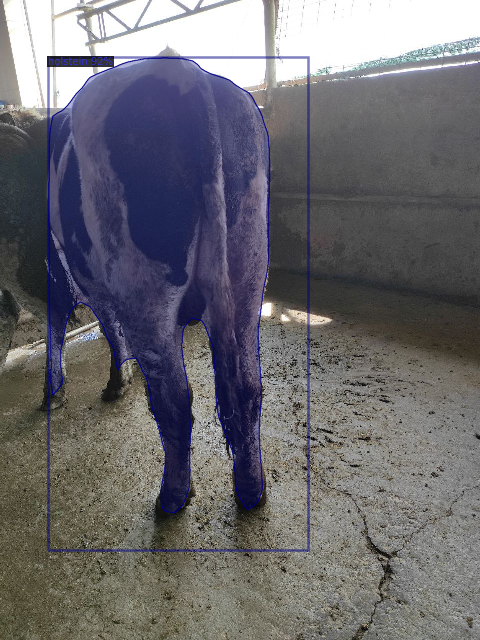

./cows_class1/val/7_Holstein_Side_LiveWeight_490_CarcassWeight_270_01.jpg


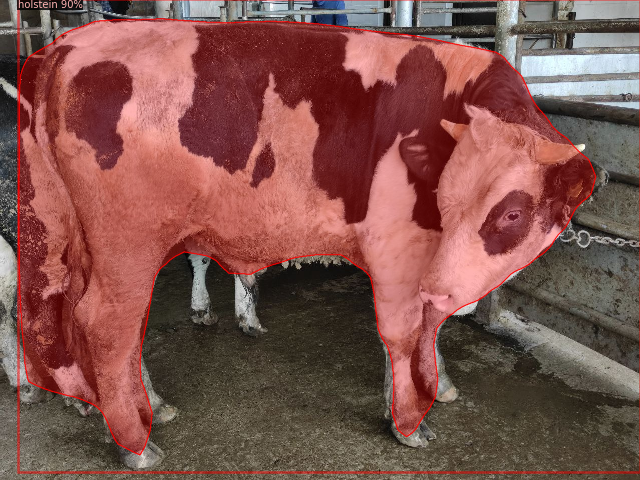

./cows_class1/val/7_Holstein_Side_LiveWeight_490_CarcassWeight_270_03.jpg


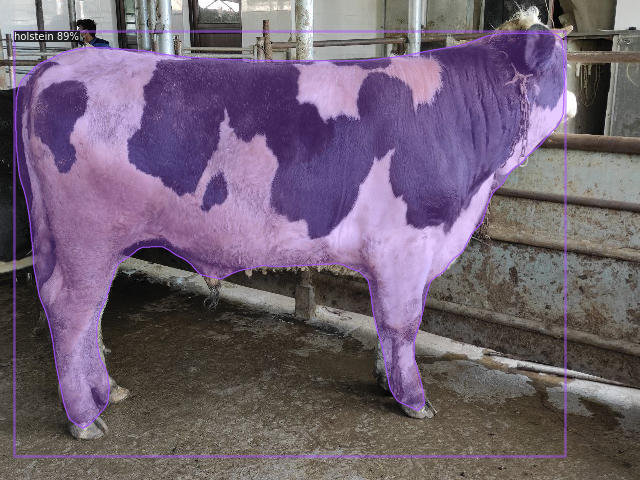

./cows_class1/val/7_Holstein_Back_LiveWeight_490_CarcassWeight_270_02.jpg


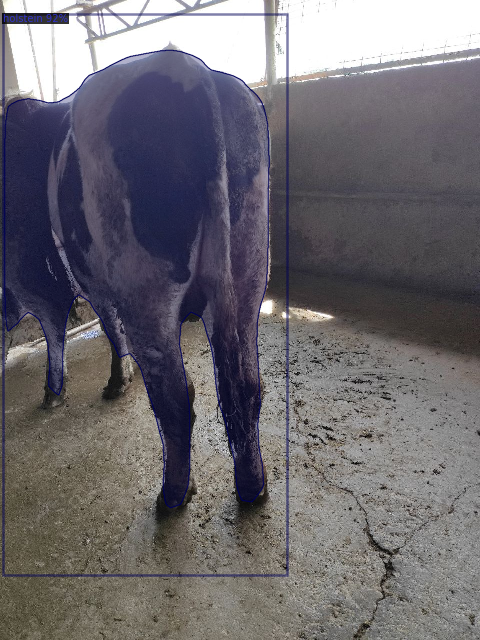

./cows_class1/val/7_Holstein_Back_LiveWeight_490_CarcassWeight_270_01.jpg


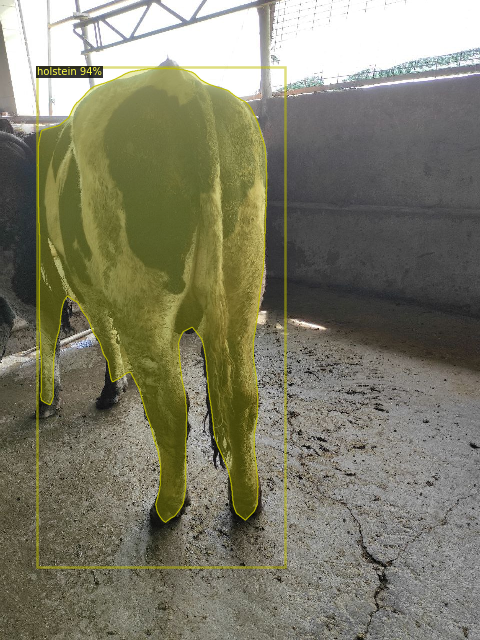

./cows_class1/val/7_Holstein_Side_LiveWeight_490_CarcassWeight_270_02.jpg


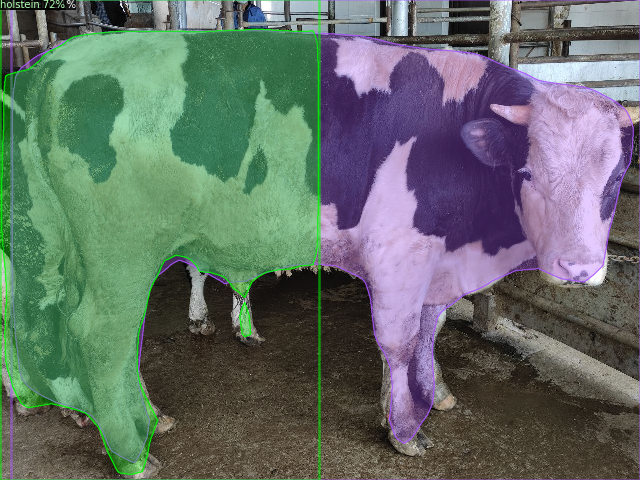

./cows_class1/val/7_Holstein_Side_LiveWeight_490_CarcassWeight_270_06.jpg


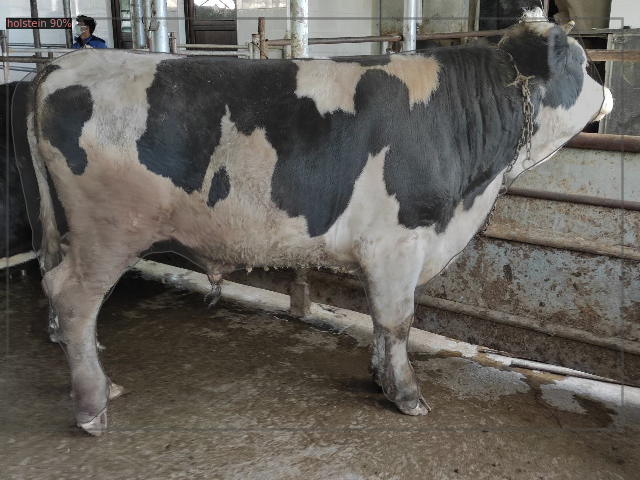

./cows_class1/val/7_Holstein_Back_LiveWeight_490_CarcassWeight_270_03.jpg


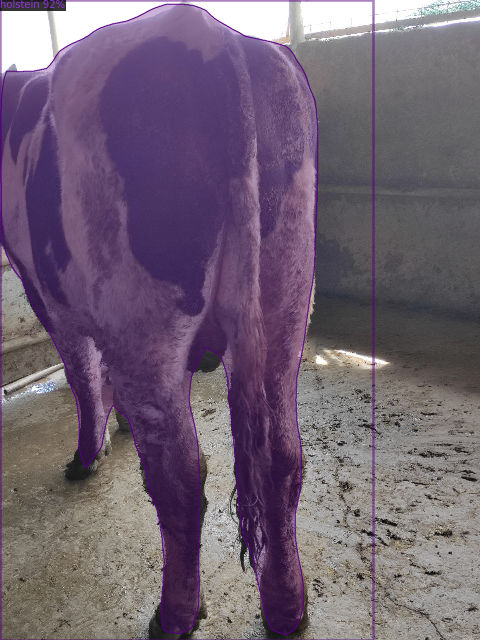

./cows_class1/val/7_Holstein_Side_LiveWeight_490_CarcassWeight_270_04.jpg


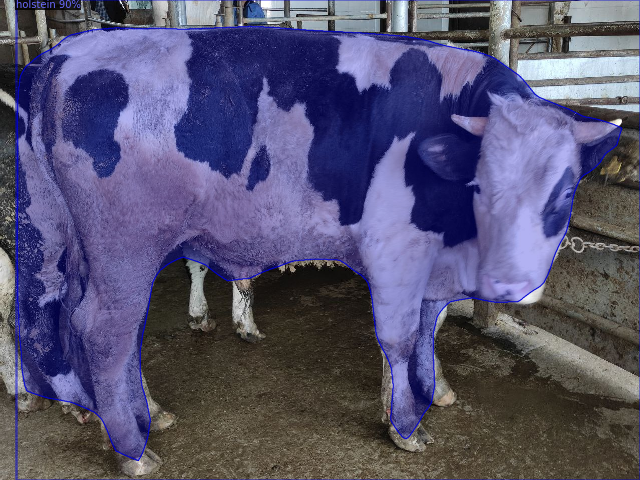

./cows_class1/val/7_Holstein_Side_LiveWeight_490_CarcassWeight_270_05.jpg


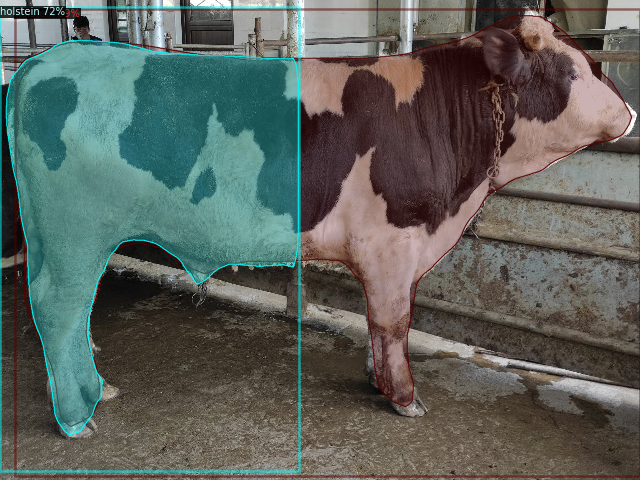

In [8]:
#validation veri setinden predictionlar
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    print(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=cow_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])